# If working in Colab 
Authenticating with Kaggle using kaggle.json

Navigate to https://www.kaggle.com. Then go to the [Account tab of your user profile](https://www.kaggle.com/me/account) and select Create API Token. This will trigger the download of kaggle.json, a file containing your API credentials.

Then run the cell below to upload kaggle.json to your Colab runtime.

In [ ]:
!pip install kaggle --upgrade

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 70 bytes


In [ ]:
!kaggle competitions download -c denoising-dirty-documents

 79% 5.00M/6.30M [00:00<00:00, 42.6MB/s]
100% 6.30M/6.30M [00:00<00:00, 40.2MB/s]
 97% 18.0M/18.5M [00:00<00:00, 46.7MB/s]
100% 18.5M/18.5M [00:00<00:00, 53.1MB/s]
 53% 5.00M/9.39M [00:00<00:00, 41.2MB/s]
100% 9.39M/9.39M [00:00<00:00, 60.0MB/s]
 23% 5.00M/21.9M [00:00<00:00, 33.5MB/s]
100% 21.9M/21.9M [00:00<00:00, 86.2MB/s]


In [ ]:
!unzip -q "train.zip" -d "train"
!unzip -q "train_cleaned.zip" -d "train_cleaned"
!unzip -q "test.zip" -d "test"

# If working in Kaggle

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/denoising-dirty-documents/train.zip
/kaggle/input/denoising-dirty-documents/sampleSubmission.csv.zip
/kaggle/input/denoising-dirty-documents/train_cleaned.zip
/kaggle/input/denoising-dirty-documents/test.zip


In [ ]:
!unzip -q "/kaggle/input/denoising-dirty-documents/train.zip" -d "train"
!unzip -q "/kaggle/input/denoising-dirty-documents/train_cleaned.zip" -d "train_cleaned"
!unzip -q "/kaggle/input/denoising-dirty-documents/test.zip" -d "test"

# Import Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import os
import cv2
from skimage.util import random_noise
from scipy import ndimage 

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, MaxPooling2D, UpSampling2D, Dropout, BatchNormalization, Input, MaxPooling2D, LeakyReLU, Concatenate
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.callbacks import EarlyStopping
from keras.applications.vgg16 import VGG16

# Explore Dataset and make splits

In [ ]:
HEIGHT = 420
WIDTH = 540

In [ ]:
def retrive_images_from_file(file_path = "train/train"):
  '''
    Retrives images from the path, then resizes them to make all images the same dimensions
    Inputs:
      file_path: the path to the folder where the images reside
    Outputs: 
      images: nd-array (m, n1, n2) Where m is the number of images in the folder and (n1, n2) are the dimension of each image in the dataset.
  '''
  image_paths = sorted(os.listdir(file_path))
  images = []
  for image_path in image_paths:
    image = cv2.imread(f"{file_path}/{image_path}")
    image = np.asarray(image, dtype='float32')
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image = cv2.resize(image, (WIDTH, HEIGHT))   
    image = image / 255.0
    images.append(image)
  
  images = np.array(images)
  return images

In [ ]:
X_train = retrive_images_from_file()
print(f"The shape of X_train is {X_train.shape}")
Y_train = retrive_images_from_file("train_cleaned/train_cleaned")
print(f"The shape of Y_train is {Y_train.shape}")
X_test = retrive_images_from_file("test/test")
print(f"The shape of X_test is {X_test.shape}")

The shape of X_train is (144, 420, 540)
The shape of Y_train is (144, 420, 540)
The shape of X_test is (72, 420, 540)


## Data Augmentation

In [ ]:
def augment_data(X, Y):
  augmented_X = []
  augmented_Y = []
  crops = [(HEIGHT//4, 3*HEIGHT//4, WIDTH//4, 3*WIDTH//4), (HEIGHT//2, HEIGHT-1, WIDTH//2, WIDTH-1)]
  for dirty_img, cleaned_img in zip(X, Y):
      augmented_X.append(dirty_img)
      augmented_Y.append(cleaned_img)
      for i in [45, 180]:
          img_X = ndimage.rotate(dirty_img, i, mode='wrap')
          img_X = cv2.resize(img_X, (WIDTH, HEIGHT), interpolation = cv2.INTER_AREA)
          img_Y = ndimage.rotate(cleaned_img, i, mode='wrap')
          img_Y = cv2.resize(img_Y, (WIDTH, HEIGHT), interpolation = cv2.INTER_AREA)
          augmented_X.append(img_X)
          augmented_Y.append(img_Y)
      for crop_img_size in crops:
          img_X = dirty_img[crop_img_size[0]:crop_img_size[1], crop_img_size[2]:crop_img_size[3]]
          img_Y = cleaned_img[crop_img_size[0]:crop_img_size[1], crop_img_size[2]:crop_img_size[3]]
          img_X = cv2.resize(img_X, (WIDTH, HEIGHT), interpolation = cv2.INTER_AREA)
          img_Y = cv2.resize(img_Y, (WIDTH, HEIGHT), interpolation = cv2.INTER_AREA)
          augmented_X.append(img_X)
          augmented_Y.append(img_Y)
  augmented_X = np.array(augmented_X)
  augmented_Y = np.array(augmented_Y)
  return augmented_X, augmented_Y

## plotting functions

In [ ]:
def show_noised_and_cleaned_image(X: np.array, Y: np.array, how_many: int = 5, random: bool = False):
  '''
    Shows some images with noise next to it the image without the noise
    [IMPORTANT]---> We can use this function to check after the model has been tested, to check if the model generated denoised images.
    Input:
      X: nd-array (m, n1, n2) which is an array of the images with noise from the dataset.
      Y: nd-array (m, n1, n2) which is an array of the images without the noise from teh dataset (The Labels).

      Where m is the number of images inputed and (n1, n2) are the dimension of each image in the dataset.    
      how_many: the number of images you want to show
      random: if you want to start showing images from a random spot in the dataset: True / else: False
  '''
  plt.figure(figsize=(15,25))
  if random:
    start = np.random.randint(0, X.shape[0] - how_many)
  else:
    start = 0
  axes_num = 0
  for i in range(start, start + how_many):
      plt.subplot(how_many,2,axes_num+1)
      plt.imshow(X[i], cmap='gray')
      plt.title('Noise image')

      plt.subplot(how_many,2,axes_num+2)
      plt.imshow(Y[i], cmap='gray')
      plt.title('Denoised image')
      axes_num += 2

  plt.show()

<Figure size 1080x1800 with 0 Axes>

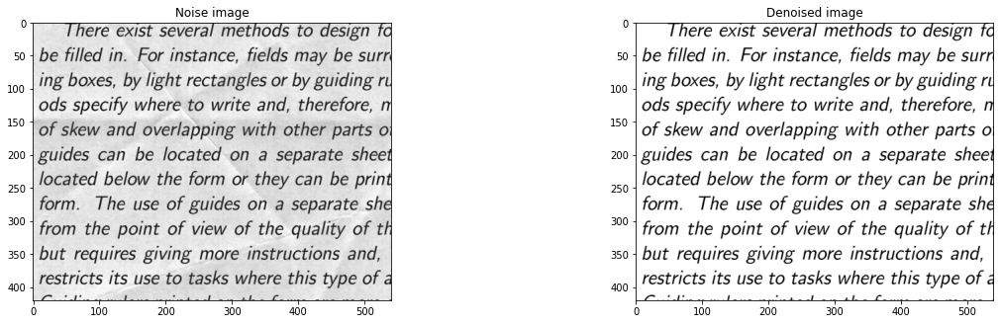

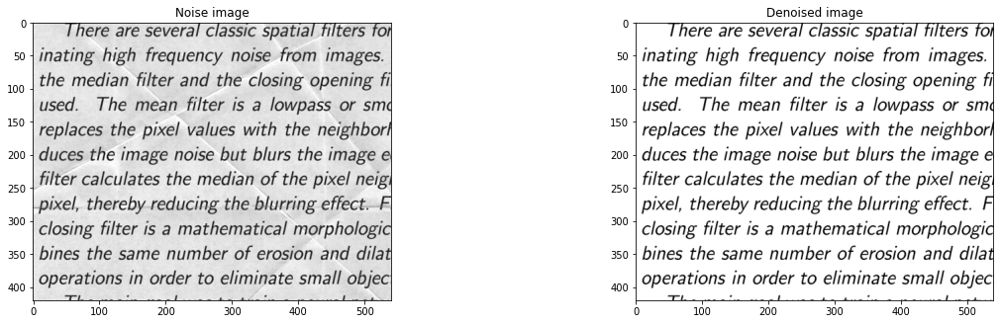

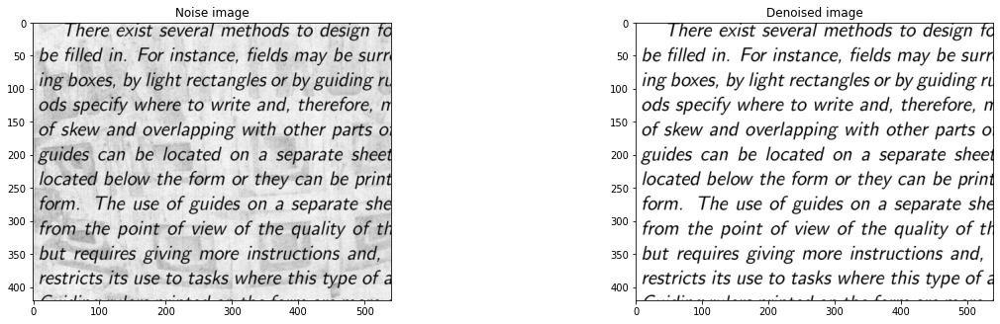

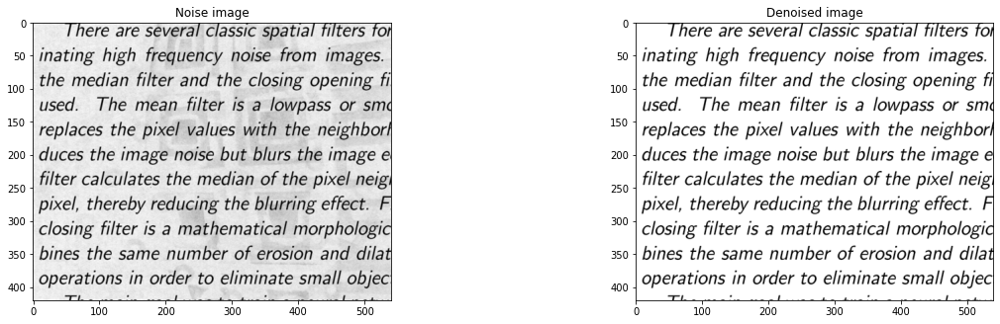

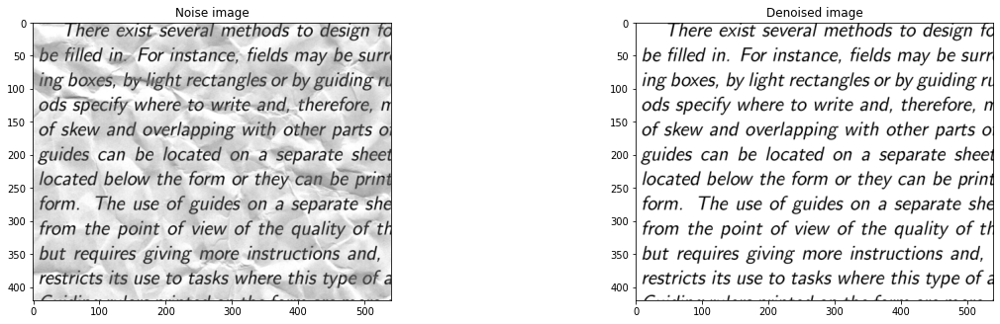

In [ ]:
show_noised_and_cleaned_image(X_train, Y_train, how_many=5, random=False)

In [ ]:
def plot_graphs(history, string, plot_val = True):
    plt.plot(history.history[string])
    lenged_list = [string]
    if plot_val:
        plt.plot(history.history[f'val_{string}'])
        lenged_list.append(f'val_{string}')
    plt.xlabel("Epochs")
    plt.ylabel(string)
    plt.legend(lenged_list)
    plt.show()

In [ ]:
def plot_histories(histories, string, plot_val = True):
    plt.clf()
    training_metric = []
    val_metric = []
    legend_list = [string]
    for history in histories:
        for point in history.history[string]:
            training_metric.append(point)
        if plot_val:
            for point in history.history[f'val_{string}']:
                val_metric.append(point)
    plt.plot(training_metric)
    if plot_val:
        plt.plot(val_metric)
        legend_list.append(f'val_{string}')
    plt.xlabel("Epochs")
    plt.ylabel(string)
    plt.legend(legend_list)
    plt.show()

## K-fold cross validation function

This function splits the training dataset into K folds where the a new model trains on K-1 folds and does validation on the remaining fold.

There is a new Model for each fold, meaning if K is 7 and epochs are 100, then there will be a total of 7 models each train for 100 epochs 

[700 epochs]

After running this function, discard all the models and train a brand new model on all the training data. 

In [ ]:
from sklearn.model_selection import KFold
def k_fold_cross_validation(k, X, Y):
    kfolds = KFold(n_splits=k, shuffle=True, random_state=11)
    i = 1
    for train_idx, val_idx in kfolds.split(X):
        x_train, y_train, x_val, y_val = X[train_idx], Y[train_idx], X[val_idx], Y[val_idx]
        model = make_CNN_model()
        print(f"==================model{i}==================\n")
        i += 1
        x_train, y_train = augment_data(X=x_train, Y = y_train)
        history = model.fit(x_train, y_train, epochs=100, batch_size=16, validation_data=(x_val, y_val))
        plot_graphs(history, 'loss')
        plot_graphs(history, 'root_mean_squared_error')

# Make Model v1 before ablation 

In [ ]:
def make_CNN_model(input_shape = (HEIGHT, WIDTH, 1)):
    input_img = Input(shape=input_shape)
  
    X = Conv2D(32, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(input_img)
    X = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X)
    X = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X)
    X = BatchNormalization()(X)
    X = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X)
    X = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X)
    X = BatchNormalization()(X)
    X = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X)

    X = Conv2D(128, (1, 1), padding='same', kernel_initializer='he_normal', activation='relu')(X)
    X = Conv2D(1, kernel_size=(3,3), padding='same', activation='sigmoid')(X)
    autoencoder = Model(input_img, X)

    optimizer = Adam(learning_rate=0.0005)
    autoencoder.compile(optimizer = optimizer, loss='mean_squared_error')

    return autoencoder

In [ ]:
CNN_model = make_CNN_model()
CNN_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 258, 540, 1)]     0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 258, 540, 32)      320       
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 258, 540, 64)      18496     
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 258, 540, 64)      36928     
_________________________________________________________________
batch_normalization_2 (Batch (None, 258, 540, 64)      256       
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 258, 540, 128)     73856     
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 258, 540, 128)     1475

In [ ]:
history = CNN_model.fit(X_train, y_train, epochs=125, batch_size=8, validation_data=(X_val, y_val))

Epoch 1/125
50/50 [==============================] - 37s 723ms/step - loss: 0.0597 - val_loss: 0.0165
Epoch 2/125
50/50 [==============================] - 36s 715ms/step - loss: 0.0050 - val_loss: 0.0024
Epoch 3/125
50/50 [==============================] - 36s 717ms/step - loss: 0.0025 - val_loss: 0.0024
Epoch 4/125
50/50 [==============================] - 36s 717ms/step - loss: 0.0068 - val_loss: 0.0017
Epoch 5/125
50/50 [==============================] - 36s 716ms/step - loss: 0.0033 - val_loss: 0.0177
Epoch 6/125
50/50 [==============================] - 36s 717ms/step - loss: 0.0017 - val_loss: 7.7621e-04
Epoch 7/125
50/50 [==============================] - 36s 716ms/step - loss: 0.0011 - val_loss: 6.2973e-04
Epoch 8/125
50/50 [==============================] - 36s 716ms/step - loss: 7.1903e-04 - val_loss: 8.2032e-04
Epoch 9/125
50/50 [==============================] - 36s 716ms/step - loss: 8.9102e-04 - val_loss: 0.0040
Epoch 10/125
50/50 [==============================] - 36s 716m

## Testing the model v1 before ablation 

In [ ]:
def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history[f'val_{string}'])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  plt.legend([string, f'val_{string}'])
  plt.show()

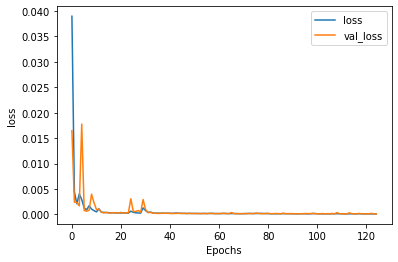

In [ ]:
plot_graphs(history, 'loss')

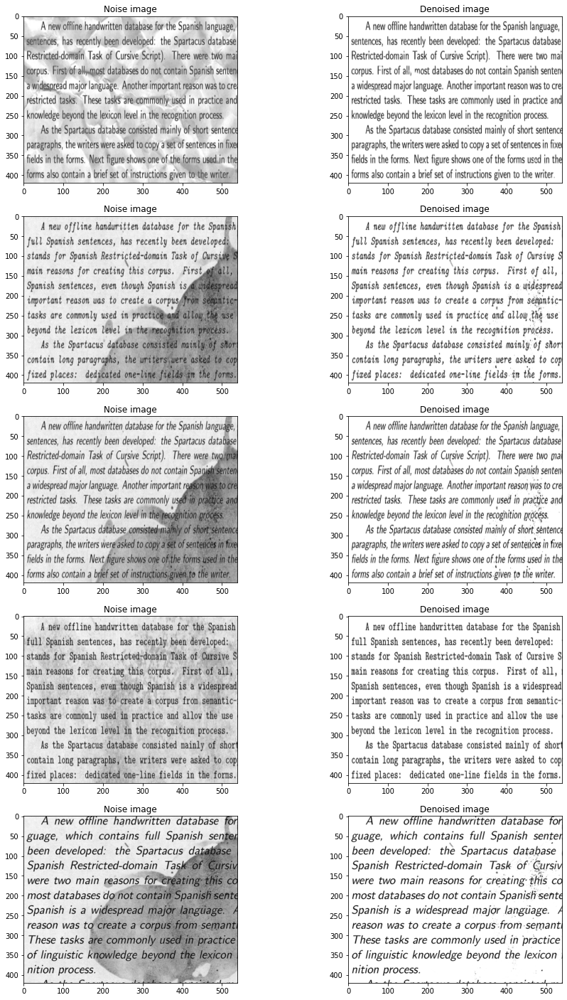

In [ ]:
decoded_imgs = CNN_model.predict(X_test, batch_size=8)

show_noised_and_cleaned_image(X_test, np.squeeze(decoded_imgs), how_many = 5, random = False)

In [ ]:
CNN_model.save('/kaggle/working/CNN_v1_augmentation.h5')

# Make Model v1 after ablation 

In [ ]:
def make_CNN_model(input_shape = (HEIGHT, WIDTH, 1)):
  
  input_img = Input(shape=input_shape)

  X = Conv2D(32, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(input_img) # slight increase in training speed i.e. loss decrease
  
  X = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X) # slight increase in training speed i.e. loss decrease

# removing this layer did not affect the training in any way
#    X = Conv2D(64, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X)
  
  # X = BatchNormalization()(X) 
  
  X = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X) # removing it resulted in underfitting

# layer was removed because it made the training unstable and slower when the first removed layer was removed
#    X = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X) 

  # X = BatchNormalization()(X) 

  X = Conv2D(128, (3, 3), padding='same', kernel_initializer='he_normal', activation='relu')(X) # removing it resulted in underfitting

  # X = BatchNormalization()(X) 

  X = Conv2D(128, (1, 1), padding='same', kernel_initializer='he_normal', activation='relu')(X) # very important layer, makes the model train better and faster than without this layer.

  X = Conv2D(1, kernel_size=(3,3), padding='same', activation='sigmoid')(X)
  CNN_model = Model(input_img, X)
  optimizer = Adam(learning_rate=0.0005)
  CNN_model.compile(optimizer = optimizer, loss='mean_squared_error', metrics=['RootMeanSquaredError'])
  return CNN_model

In [ ]:
CNN_model = make_CNN_model()
CNN_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 420, 540, 1)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 420, 540, 32)      320       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 420, 540, 64)      18496     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 420, 540, 128)     73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 420, 540, 128)     147584    
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 420, 540, 128)     16512     
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 420, 540, 1)       1153  

## Cross-validation

In [ ]:
k_fold_cross_validation(k = 7, X = X_train, Y = Y_train)

## to train one model on all the training data

In [ ]:
X_train, Y_train = augment_data(X_train, Y_train)
X_train, Y_train = shuffle(X_train, Y_train, random_state=11)
X_train.shape, Y_train.shape

((720, 258, 540), (720, 258, 540))

In [ ]:
history = CNN_model.fit(X_train, Y_train, epochs=125, batch_size=8)

Epoch 1/125
90/90 [==============================] - 22s 227ms/step - loss: 0.0171 - root_mean_squared_error: 0.1218
Epoch 2/125
90/90 [==============================] - 20s 227ms/step - loss: 0.0021 - root_mean_squared_error: 0.0457
Epoch 3/125
90/90 [==============================] - 20s 227ms/step - loss: 0.0015 - root_mean_squared_error: 0.0393
Epoch 4/125
90/90 [==============================] - 20s 227ms/step - loss: 0.0013 - root_mean_squared_error: 0.0366
Epoch 5/125
90/90 [==============================] - 20s 227ms/step - loss: 0.0012 - root_mean_squared_error: 0.0353
Epoch 6/125
90/90 [==============================] - 20s 227ms/step - loss: 0.0011 - root_mean_squared_error: 0.0332
Epoch 7/125
90/90 [==============================] - 20s 227ms/step - loss: 0.0011 - root_mean_squared_error: 0.0324
Epoch 8/125
90/90 [==============================] - 20s 227ms/step - loss: 0.0010 - root_mean_squared_error: 0.0319
Epoch 9/125
90/90 [==============================] - 20s 227ms/s

In [ ]:
history1 = CNN_model.fit(X_train, Y_train, epochs=30, batch_size=8)

Epoch 1/30
90/90 [==============================] - 20s 227ms/step - loss: 2.6703e-04 - root_mean_squared_error: 0.0163
Epoch 2/30
90/90 [==============================] - 20s 227ms/step - loss: 2.7704e-04 - root_mean_squared_error: 0.0166
Epoch 3/30
90/90 [==============================] - 20s 227ms/step - loss: 2.6607e-04 - root_mean_squared_error: 0.0163
Epoch 4/30
90/90 [==============================] - 20s 227ms/step - loss: 2.6839e-04 - root_mean_squared_error: 0.0164
Epoch 5/30
90/90 [==============================] - 20s 227ms/step - loss: 2.7373e-04 - root_mean_squared_error: 0.0165
Epoch 6/30
90/90 [==============================] - 20s 227ms/step - loss: 2.7490e-04 - root_mean_squared_error: 0.0166
Epoch 7/30
90/90 [==============================] - 20s 227ms/step - loss: 2.6469e-04 - root_mean_squared_error: 0.0163
Epoch 8/30
90/90 [==============================] - 20s 227ms/step - loss: 2.5994e-04 - root_mean_squared_error: 0.0161
Epoch 9/30
90/90 [======================

## Testing Model v1 after ablation 

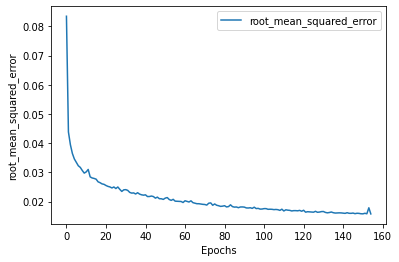

In [ ]:
plot_histories([history, history1], 'root_mean_squared_error', plot_val=False)

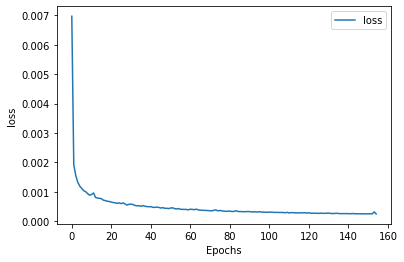

In [ ]:
plot_histories([history, history1], 'loss', plot_val=False)

<Figure size 1080x1800 with 0 Axes>

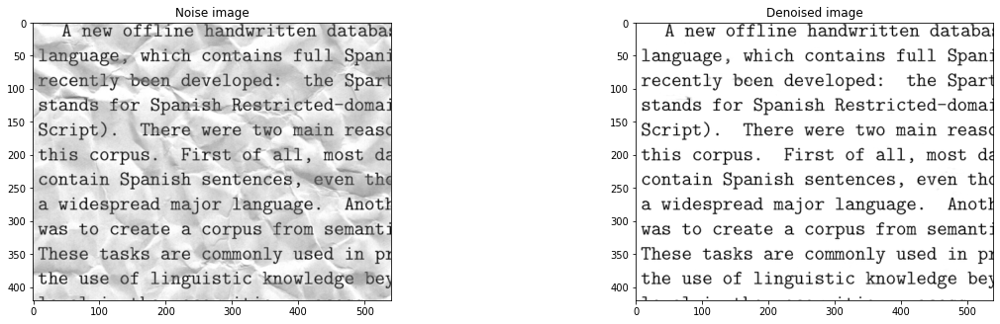

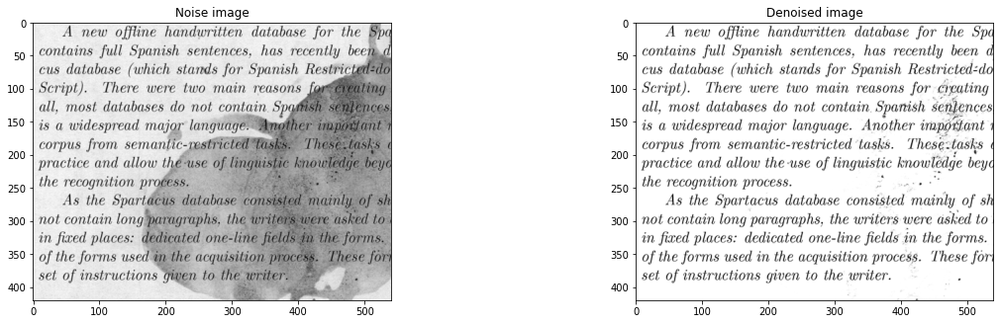

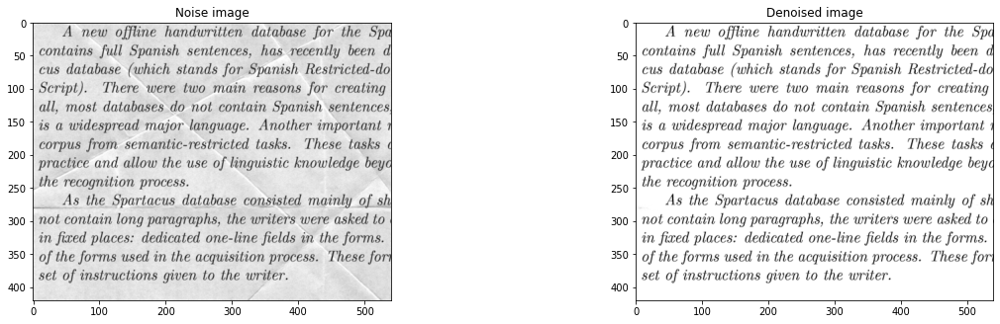

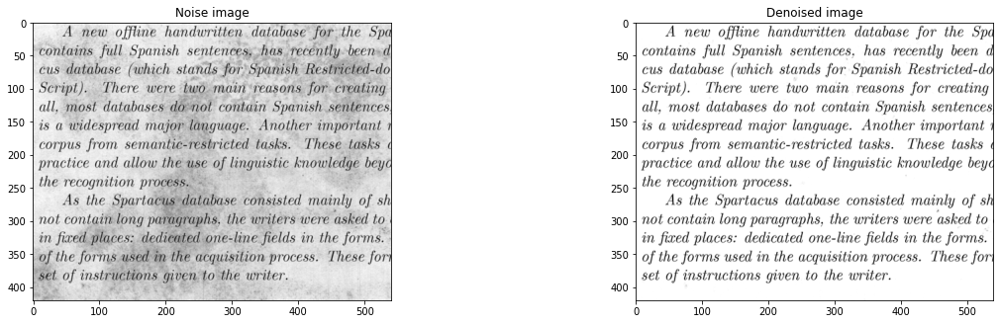

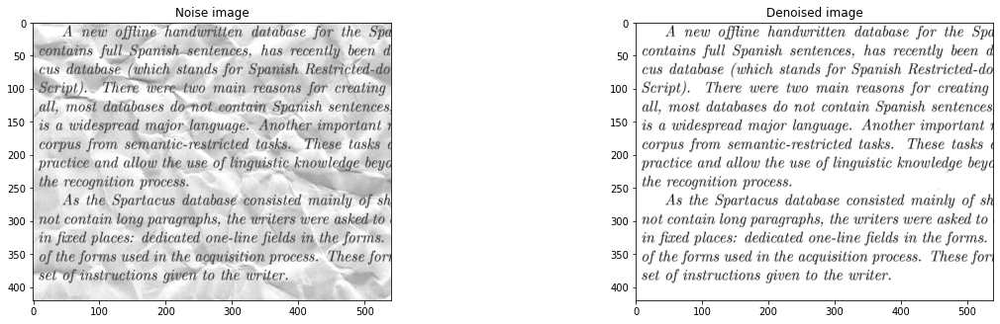

In [ ]:
decoded_imgs = CNN_model.predict(X_test, batch_size=8)

show_noised_and_cleaned_image(X_test, np.squeeze(decoded_imgs), how_many = 5, random = True)

In [ ]:
CNN_model.save('/kaggle/working/CNN_v1_after_abliationStudy.h5')

# Make Model V2 (Transfer Learning)

In [ ]:
def make_VGG_model(input_shape = (HEIGHT, WIDTH, 1)):
    input_img = Input(shape=input_shape)
    input_conc = Concatenate()([input_img, input_img, input_img])
  
    model = VGG16(include_top=False, input_tensor=input_conc)
    for layer in model.layers:
        layer.trainable=False
    
    skip1 = model.layers[3].output
    skip2 = model.layers[6].output
    
    # dblock_3
    model = model.layers[9].output
    model = Conv2D(128, (3, 3), kernel_initializer='he_normal', activation='relu', padding='same',name='latent')(model)
    model = UpSampling2D((2, 2))(model)
    model = tf.keras.layers.Add()([model, skip2])
    
    # dblock_2
    model = Conv2D(128, kernel_size=(3, 3), padding='same', activation='relu')(model)
    model = Conv2D(64, kernel_size=(3, 3), padding='same', activation='sigmoid')(model)
    model = UpSampling2D((2, 2))(model)
    model = tf.keras.layers.Add()([model, skip1])
    
    # dblock_1
    model = Conv2D(64, kernel_size=(3, 3), padding='same', activation='sigmoid')(model)
    model = Conv2D(1, kernel_size=(3, 3), padding='same', activation='sigmoid')(model)
    
    model = Model(input_img, model)

    optimizer = Adam(learning_rate=0.0005)
    model.compile(optimizer = optimizer, loss='mean_squared_error')

    return model

In [ ]:
VGG_model = make_VGG_model()
VGG_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 420, 540, 1) 0                                            
__________________________________________________________________________________________________
concatenate_11 (Concatenate)    (None, 420, 540, 3)  0           input_12[0][0]                   
                                                                 input_12[0][0]                   
                                                                 input_12[0][0]                   
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 420, 540, 64) 1792        concatenate_11[0][0]             
____________________________________________________________________________________________

In [ ]:
history = VGG_model.fit(X_train, y_train, epochs=125, batch_size=8, validation_data=(X_val, y_val))

Epoch 1/125
75/75 [==============================] - 16s 217ms/step - loss: 0.0015 - val_loss: 0.0015
Epoch 2/125
75/75 [==============================] - 16s 217ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 3/125
75/75 [==============================] - 17s 223ms/step - loss: 0.0012 - val_loss: 0.0012
Epoch 4/125
75/75 [==============================] - 16s 216ms/step - loss: 0.0012 - val_loss: 0.0011
Epoch 5/125
75/75 [==============================] - 16s 217ms/step - loss: 0.0011 - val_loss: 0.0010
Epoch 6/125
75/75 [==============================] - 16s 216ms/step - loss: 0.0010 - val_loss: 9.6341e-04
Epoch 7/125
75/75 [==============================] - 16s 217ms/step - loss: 9.5803e-04 - val_loss: 9.1694e-04
Epoch 8/125
75/75 [==============================] - 16s 216ms/step - loss: 9.1023e-04 - val_loss: 8.9090e-04
Epoch 9/125
75/75 [==============================] - 16s 217ms/step - loss: 8.6061e-04 - val_loss: 8.2840e-04
Epoch 10/125
75/75 [==============================] - 

## Testing the model v2

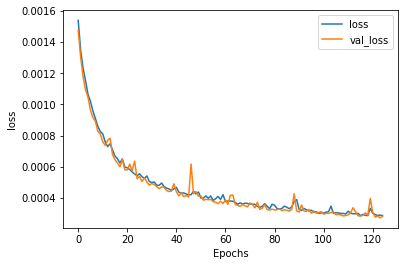

In [ ]:
plot_graphs(history, 'loss')

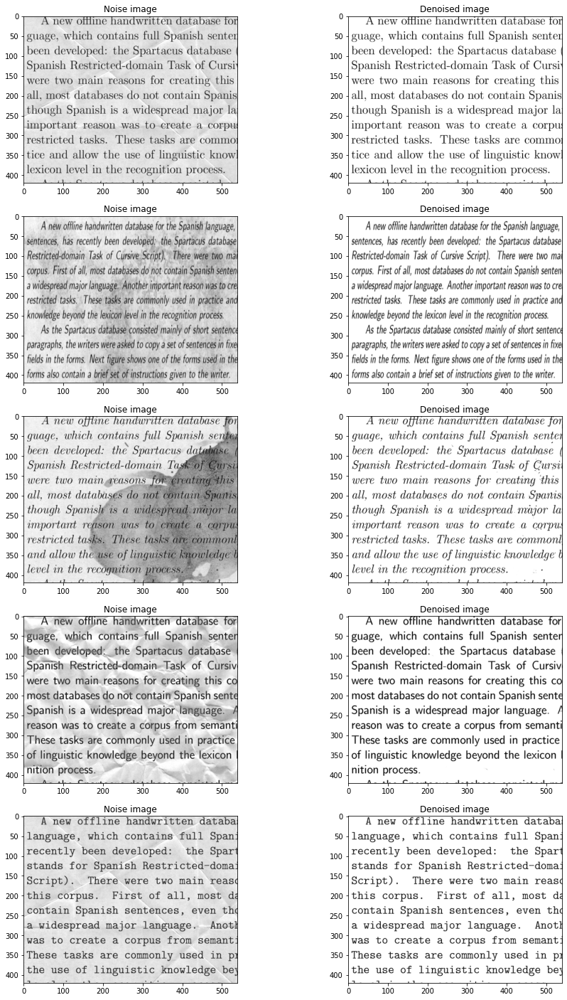

In [ ]:
decoded_imgs = VGG_model.predict(X_test, batch_size=8)

show_noised_and_cleaned_image(X_test, np.squeeze(decoded_imgs), how_many = 5, random = False)

In [ ]:
VGG_model.save('/kaggle/working/VGG.h5')

# Load Models

In [ ]:
CNN_model_v1_after_ablationStudy = tf.keras.models.load_model('/content/CNN_420.h5')

In [ ]:
decoded_imgs = CNN_model_v1_after_ablationStudy.predict(X_test, batch_size=16)

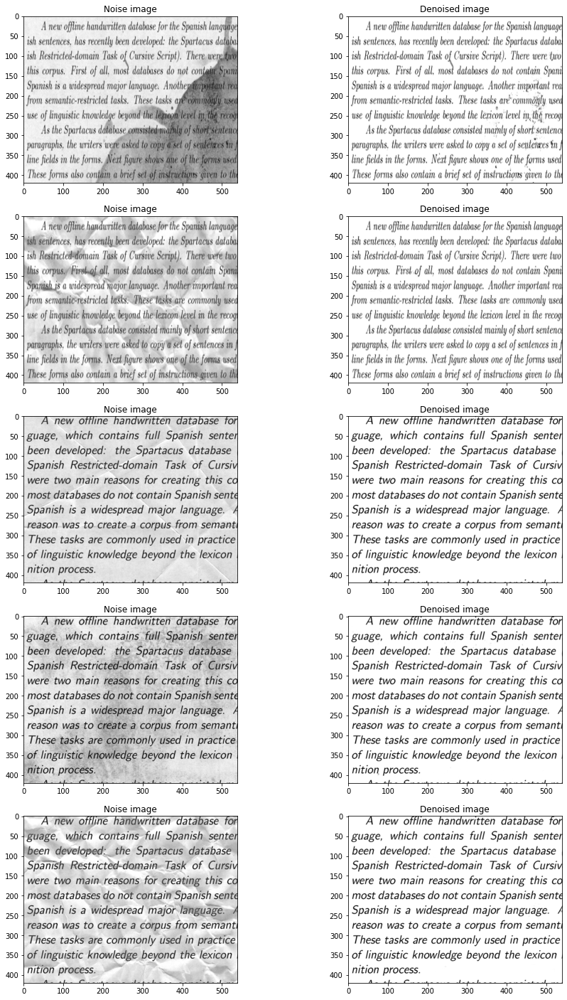

In [ ]:
show_noised_and_cleaned_image(X_test, np.squeeze(decoded_imgs), how_many = 5, random = False)

['photo_2021-09-12_18-33-35.jpg']
(520, 420, 3)


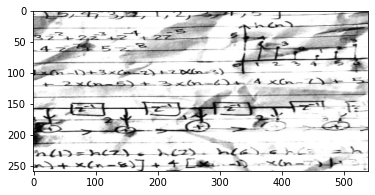

In [ ]:
photo = retrive_images_from_file(file_path='photo')
plt.imshow(np.squeeze(photo), cmap='gray')

In [ ]:
img = CNN_model_v1_after_ablationStudy.predict(photo)

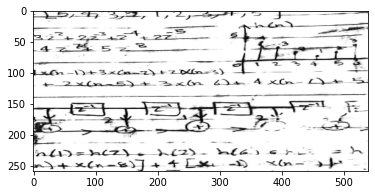

In [ ]:
plt.imshow(np.squeeze(img), cmap='gray')

In [ ]:
VGG_model = tf.keras.models.load_model('/content/VGG_model.h5')

In [ ]:
decoded_imgs = CNN_model_v1_after_ablationStudy.predict(X_test, batch_size=16)

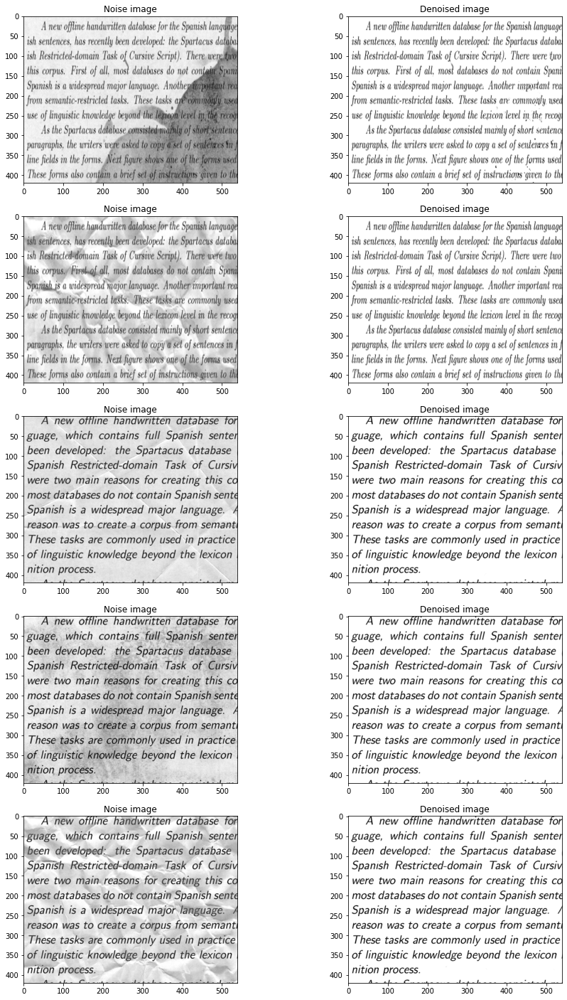

In [ ]:
show_noised_and_cleaned_image(X_test, np.squeeze(decoded_imgs), how_many = 5, random = False)

['photo_2021-09-12_18-33-35.jpg']
(520, 420, 3)


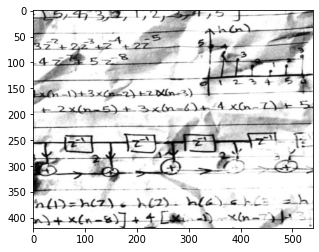

In [ ]:
photo = retrive_images_from_file(file_path='phot')
plt.imshow(np.squeeze(photo), cmap='gray')

In [ ]:
print(photo.shape)

(1, 420, 540)


In [ ]:
img = VGG_model.predict(photo)

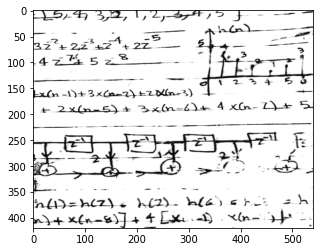

In [ ]:
plt.imshow(np.squeeze(img), cmap='gray')

In [ ]:
decoded_imgs = VGG_model.predict(X_test, batch_size=16)

# Making Submission file

In [ ]:
test_img = sorted(os.listdir('test/test'))
print(test_img[0])

1.png


In [ ]:
ids = []
vals = []
for i, f in enumerate(test_img):
    file_path = 'test/test/' + f
    imgid = int(f[:-4])
    img = cv2.imread(file_path, 0)
    img_shape = img.shape
    preds_reshaped = cv2.resize(decoded_imgs[i], (img_shape[1], img_shape[0]))

    for r in range(img_shape[0]):
        for c in range(img_shape[1]):
            ids.append(str(imgid)+'_'+str(r + 1)+'_'+str(c + 1))
            vals.append(preds_reshaped[r, c])

submission = pd.DataFrame({'id': ids, 'value': vals})
submission.to_csv('submission.csv',index = False)

print('Results saved to submission.csv!')

# quick check if length of IDs is OK
# we should get there number 14230080
print('Length of IDs: {}'.format(len(ids)))

Results saved to submission.csv!
Length of IDs: 14230080
